# Projeto: Machine Learning II
***Projeto Santander Coders 2023.2 | Ada***

**Professor:** Jorge Chamby-Diaz

**Descrição:** Este notebook contém o desenvolvimento do projeto proposto como conclusão da disciplina de `Machine Learning II`.

**Dataset(s) Utilizado(s):** [covid19br](https://github.com/wcota/covid19br/)

> W. Cota, “Monitoring the number of COVID-19 cases and deaths in brazil at municipal and federative units level”, SciELOPreprints:362 (2020), 10.1590/scielopreprints.362

## Parte 0: Bibliotecas Utilizadas e Imports

In [52]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score


## Parte 1: Visualizando o conjunto de dados

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/wcota/covid19br/master/cases-brazil-states.csv')

# Como sugerido pelo autor do dataset
# vamos alterar a coluna 'date' para um formato 'datatime'
df['date'] = pd.to_datetime(df['date'])

df.head(10)

,epi_week,date,country,state,city,newDeaths,deaths,newCases,totalCases,deathsMS,...,tests,tests_per_100k_inhabitants,vaccinated,vaccinated_per_100_inhabitants,vaccinated_second,vaccinated_second_per_100_inhabitants,vaccinated_single,vaccinated_single_per_100_inhabitants,vaccinated_third,vaccinated_third_per_100_inhabitants
0,9,2020-02-25,Brazil,SP,TOTAL,0,0,1,1,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,9,2020-02-25,Brazil,TOTAL,TOTAL,0,0,1,1,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,9,2020-02-26,Brazil,SP,TOTAL,0,0,0,1,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,9,2020-02-26,Brazil,TOTAL,TOTAL,0,0,0,1,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,9,2020-02-27,Brazil,SP,TOTAL,0,0,0,1,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,9,2020-02-27,Brazil,TOTAL,TOTAL,0,0,0,1,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,9,2020-02-28,Brazil,SP,TOTAL,0,0,1,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,9,2020-02-28,Brazil,TOTAL,TOTAL,0,0,1,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,2020-02-29,Brazil,SP,TOTAL,0,0,0,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,9,2020-02-29,Brazil,TOTAL,TOTAL,0,0,0,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
print('Shape: ', df.shape)
df.info()

Shape:  (30842, 26)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30842 entries, 0 to 30841
Data columns (total 26 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   epi_week                               30842 non-null  int64         
 1   date                                   30842 non-null  datetime64[ns]
 2   country                                30842 non-null  object        
 3   state                                  30842 non-null  object        
 4   city                                   30842 non-null  object        
 5   newDeaths                              30842 non-null  int64         
 6   deaths                                 30842 non-null  int64         
 7   newCases                               30842 non-null  int64         
 8   totalCases                             30842 non-null  int64         
 9   deathsMS                               30

Com a ajuda da descrição das colunas fornecida pelo autor [aqui](https://github.com/wcota/covid19br/blob/master/DESCRIPTION.md), vamos filtrar alguns dados e criar novas colunas que podem ser úteis para nossa análise:

In [4]:
# Criando novas colunas
df['active_cases'] = df['totalCases'] - df['deaths'] - df['recovered']

In [5]:
df[['epi_week', 'vaccinated', 'vaccinated_second', 'vaccinated_third', 'active_cases']].tail(10)

,epi_week,vaccinated,vaccinated_second,vaccinated_third,active_cases
30832,311,14716972.0,13809945.0,12211486.0,728776.0
30833,311,2979308.0,2772139.0,2030138.0,197245.0
30834,311,1328876.0,1186864.0,697735.0,116795.0
30835,311,473511.0,369284.0,175984.0,28436.0
30836,311,9877242.0,9431834.0,8439439.0,774032.0
30837,311,6308275.0,5862014.0,4166331.0,356600.0
30838,311,2023048.0,1860868.0,1376006.0,39613.0
30839,311,43381275.0,40857206.0,29057424.0,1440403.0
30840,311,1183632.0,1029319.0,595805.0,79842.0
30841,311,183869403.0,170385963.0,126348017.0,9004794.0


In [6]:
unique_weeks = df['epi_week'].unique()
unique_weeks.sort()

mapped_values = { value: new_value for new_value, value in enumerate(unique_weeks, start=unique_weeks[0])}
df['seq_epi_week'] = df['epi_week'].map(mapped_values)

In [7]:
df['epi_week'].unique()

array([  9,  10,  11,  12,  13,  14,  15,  16,  17,  18,  19,  20,  21,
        22,  23,  24,  25,  26,  27,  28,  29,  30,  31,  32,  33,  34,
        35,  36,  37,  38,  39,  40,  41,  42,  43,  44,  45,  46,  47,
        48,  49,  50,  51,  52,  53, 101, 102, 103, 104, 105, 106, 107,
       108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120,
       121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133,
       134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146,
       147, 148, 149, 150, 151, 152, 201, 202, 203, 204, 205, 206, 207,
       208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220,
       221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233,
       234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246,
       247, 248, 249, 250, 251, 252, 301, 302, 303, 304, 305, 306, 307,
       308, 309, 310, 311], dtype=int64)

In [8]:
df['seq_epi_week'].unique()

array([  9,  10,  11,  12,  13,  14,  15,  16,  17,  18,  19,  20,  21,
        22,  23,  24,  25,  26,  27,  28,  29,  30,  31,  32,  33,  34,
        35,  36,  37,  38,  39,  40,  41,  42,  43,  44,  45,  46,  47,
        48,  49,  50,  51,  52,  53,  54,  55,  56,  57,  58,  59,  60,
        61,  62,  63,  64,  65,  66,  67,  68,  69,  70,  71,  72,  73,
        74,  75,  76,  77,  78,  79,  80,  81,  82,  83,  84,  85,  86,
        87,  88,  89,  90,  91,  92,  93,  94,  95,  96,  97,  98,  99,
       100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112,
       113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125,
       126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138,
       139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151,
       152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164,
       165, 166, 167, 168], dtype=int64)

### O que é possível entender a partir desses dados?
<h4>Descrição das colunas</h4>

| coluna | descrição |
| :--- | --- |
| epi_week | Representa a semana epidemiológica, agregada ao ano da epidemia. Ano 2020 conta como ano 0, e é representado pelos valores 1 a 53. Ano 2021 é representado pelos números 101 a 152, e assim por diante. |
| date | Data de divulgação |
| country | Nome do país (sempre Brazil) |
| state | Nome da unidade federativa |
| city | Sempre “TOTAL” |
| newDeaths | Número de novos óbitos divulgados |
| deaths | Número acumulado de óbitos |
| newCases | Número de novos casos divulgados |
| totalCases | Número acumulado de casos |
| deathsMS | Número acumulado de obitos pelo Ministério da Saúde |
| totalCasesMS | Número acumulado de casos pelo Ministério da Saúde |
| deaths_per_100k_inhabitants | Número de óbitos por 100 mil habitantes |
| totalCases_per_100k_inhabitants | Número de casos por 100 mil habitantes |
| deaths_by_totalCases | Razão entre número de óbitos e casos (`deaths`/`totalCases`) |
| recovered | Número de recuperados |
| suspects | Número de suspeitos |
| tests | Número de testes realizados |
| tests_per_100k_inhabitants | Número de testes realizados por 100 mil habitantes |
| vaccinated | Número de pessoas que receberam a primeira dose |
| vaccinated_per_100_inhabitants | Porcentagem de pessoas que receberam a primeira dose |
| vaccinated_second | Número de pessoas que receberam a segunda dose |
| vaccinated_second_per_100_inhabitants | Porcentagem de pessoas que receberam a segunda dose |
| vaccinated_single | Número de pessoas que receberam a dose única |
| vaccinated_single_per_100_inhabitants | Porcentagem de pessoas que receberam a dose única |
| vaccinated_third | Número de pessoas que receberam a dose de reforço |
| vaccinated_third_per_100_inhabitants | Porcentagem de pessoas que receberam a dose de reforço |
| active_cases | Casos ainda ativos |
| seq_epi_week | Representa a semana epidemiológica de forma sequêncial. |

Dessa forma, vemos que algumas colunas podem ser descartadas antes de começarmos a analisar os dados. Serão elas:
- `country`: possui sempre o valor `Brazil`, informação que já temos de forma geral.
- `city`: possui sempre o valor `TOTAL`, que não nos informa nada específico.
- `death_by_totalCases`: é um valor diretamente relacionado a dois valores que já possuímos.
- `deathsMS`: se relaciona à mesma informação da coluna `deaths`.
- `totalCasesMS`: se relaciona à mesma informação da coluna `totalCases`.

Além disso, algumas colunas mostram valores brutos, enquanto outras mostram valores ajustados para uma comparação entre estados com populações diferentes. Transformar-lo-emos em 2 _datasets_ distintos.

Outro ponto perceptível é que existe um conjunto de entradas, marcados na coluna `state` com o valor `TOTAL`, que representa o valor acumulado entre todos os estados. Vamos filtrar o conjunto, excluindo essas linhas.

In [9]:
# Tratamento: Removendo agregação em 'state'
df = df[df['state'] != 'TOTAL']
df.head(10)

,epi_week,date,country,state,city,newDeaths,deaths,newCases,totalCases,deathsMS,...,vaccinated,vaccinated_per_100_inhabitants,vaccinated_second,vaccinated_second_per_100_inhabitants,vaccinated_single,vaccinated_single_per_100_inhabitants,vaccinated_third,vaccinated_third_per_100_inhabitants,active_cases,seq_epi_week
0,9,2020-02-25,Brazil,SP,TOTAL,0,0,1,1,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
2,9,2020-02-26,Brazil,SP,TOTAL,0,0,0,1,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
4,9,2020-02-27,Brazil,SP,TOTAL,0,0,0,1,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
6,9,2020-02-28,Brazil,SP,TOTAL,0,0,1,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
8,9,2020-02-29,Brazil,SP,TOTAL,0,0,0,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
10,10,2020-03-01,Brazil,SP,TOTAL,0,0,0,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10
12,10,2020-03-02,Brazil,SP,TOTAL,0,0,0,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10
14,10,2020-03-03,Brazil,SP,TOTAL,0,0,0,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10
16,10,2020-03-04,Brazil,SP,TOTAL,0,0,1,3,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10
18,10,2020-03-05,Brazil,RJ,TOTAL,0,0,1,1,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10


In [10]:
drop_columns = ['country', 'city', 'deaths_by_totalCases', 'deathsMS', 'totalCasesMS', 'epi_week', 'date']
dados_brutos = ['newDeaths', 'deaths', 'newCases', 'totalCases', 'recovered',
                'suspects', 'tests', 'vaccinated', 'vaccinated_second',
                'vaccinated_single', 'vaccinated_third', 'active_cases']
dados_ajustados = ['deaths_per_100k_inhabitants', 'totalCases_per_100k_inhabitants',
                    'tests_per_100k_inhabitants', 'vaccinated_per_100_inhabitants',
                    'vaccinated_second_per_100_inhabitants', 'vaccinated_single_per_100_inhabitants',
                    'vaccinated_third_per_100_inhabitants']

# fazemos drops no dataset original, combinando as colunas a serem descartadas de modo geral
# com as colunas que serao usadas apenas pelo dataset complementar
df_bruto = df.drop(columns=[*drop_columns, *dados_ajustados])
df_comparacao = df.drop(columns=[*drop_columns, *dados_brutos])

In [11]:
df_bruto.head(10)

,state,newDeaths,deaths,newCases,totalCases,recovered,suspects,tests,vaccinated,vaccinated_second,vaccinated_single,vaccinated_third,active_cases,seq_epi_week
0,SP,0,0,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
2,SP,0,0,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
4,SP,0,0,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
6,SP,0,0,1,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
8,SP,0,0,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
10,SP,0,0,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10
12,SP,0,0,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10
14,SP,0,0,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10
16,SP,0,0,1,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10
18,RJ,0,0,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10


In [12]:
df_bruto.info()

<class 'pandas.core.frame.DataFrame'>
Index: 29724 entries, 0 to 30840
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   state              29724 non-null  object 
 1   newDeaths          29724 non-null  int64  
 2   deaths             29724 non-null  int64  
 3   newCases           29724 non-null  int64  
 4   totalCases         29724 non-null  int64  
 5   recovered          29108 non-null  float64
 6   suspects           29157 non-null  float64
 7   tests              28451 non-null  float64
 8   vaccinated         21320 non-null  float64
 9   vaccinated_second  20685 non-null  float64
 10  vaccinated_single  17060 non-null  float64
 11  vaccinated_third   14941 non-null  float64
 12  active_cases       29108 non-null  float64
 13  seq_epi_week       29724 non-null  int64  
dtypes: float64(8), int64(5), object(1)
memory usage: 3.4+ MB


In [13]:
df_comparacao.head(10)

,state,deaths_per_100k_inhabitants,totalCases_per_100k_inhabitants,tests_per_100k_inhabitants,vaccinated_per_100_inhabitants,vaccinated_second_per_100_inhabitants,vaccinated_single_per_100_inhabitants,vaccinated_third_per_100_inhabitants,seq_epi_week
0,SP,0.0,0.00218,NaN,NaN,NaN,NaN,NaN,9
2,SP,0.0,0.00218,NaN,NaN,NaN,NaN,NaN,9
4,SP,0.0,0.00218,NaN,NaN,NaN,NaN,NaN,9
6,SP,0.0,0.00436,NaN,NaN,NaN,NaN,NaN,9
8,SP,0.0,0.00436,NaN,NaN,NaN,NaN,NaN,9
10,SP,0.0,0.00436,NaN,NaN,NaN,NaN,NaN,10
12,SP,0.0,0.00436,NaN,NaN,NaN,NaN,NaN,10
14,SP,0.0,0.00436,NaN,NaN,NaN,NaN,NaN,10
16,SP,0.0,0.00653,NaN,NaN,NaN,NaN,NaN,10
18,RJ,0.0,0.00579,NaN,NaN,NaN,NaN,NaN,10


In [14]:
df_comparacao.info()

<class 'pandas.core.frame.DataFrame'>
Index: 29724 entries, 0 to 30840
Data columns (total 9 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   state                                  29724 non-null  object 
 1   deaths_per_100k_inhabitants            29724 non-null  float64
 2   totalCases_per_100k_inhabitants        29724 non-null  float64
 3   tests_per_100k_inhabitants             28451 non-null  float64
 4   vaccinated_per_100_inhabitants         21320 non-null  float64
 5   vaccinated_second_per_100_inhabitants  20685 non-null  float64
 6   vaccinated_single_per_100_inhabitants  17060 non-null  float64
 7   vaccinated_third_per_100_inhabitants   14941 non-null  float64
 8   seq_epi_week                           29724 non-null  int64  
dtypes: float64(7), int64(1), object(1)
memory usage: 2.3+ MB


### Compreendendo as informações de maneira mais visual
Vamos tentar criar alguns gráficos, para começar a enteder o que podemos inferir dos dados, e quais problemas podemos levantar para tentar responder com modelos de _Machine Learning_.

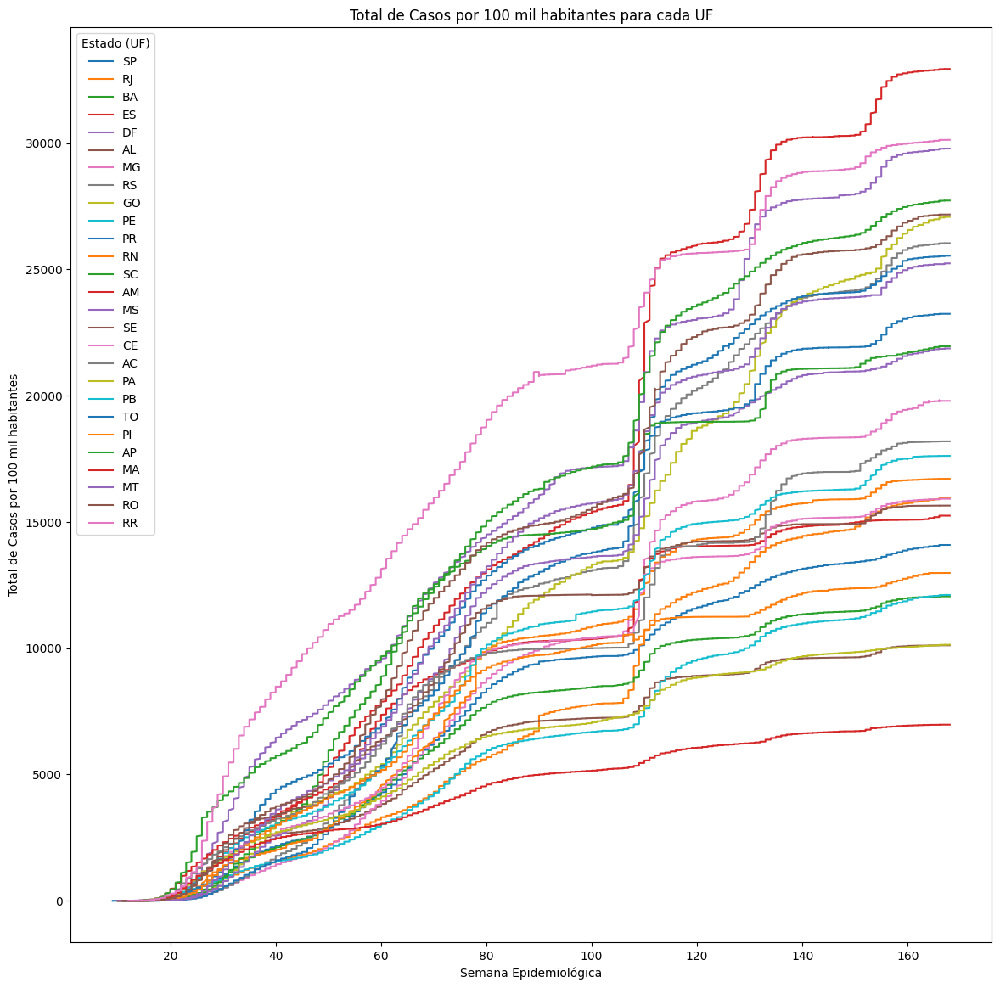

In [15]:
states = df_comparacao['state'].unique().tolist()

plt.figure(figsize=(14, 14))

for state in states:
    state_data = df_comparacao[df_comparacao['state'] == state]
    plt.plot(
        state_data['seq_epi_week'],
        state_data['totalCases_per_100k_inhabitants'],
        label=state,
        linestyle='-',
        )

plt.title('Total de Casos por 100 mil habitantes para cada UF')
plt.xlabel('Semana Epidemiológica')
plt.ylabel('Total de Casos por 100 mil habitantes')

# plt.gcf().autofmt_xdate()

plt.legend(title='Estado (UF)')

plt.show()

Podemos perceber que houve um crescimento geral, como era esperado, da taxa de casos entre os estados com o decorrer do tempo de recorte do _dataset_. No entanto, é possível perceber que mesmo com os dados normalizados para cada estado, essa taxa de crescimento difere bastante entre estados à medida que o tempo decorre.

Usando `Plotly`, vamos tentar identificar um pouco melhor como as coisas acontecem.

In [16]:
fig = px.line(
    data_frame=df_comparacao,
    x='seq_epi_week',
    y='totalCases_per_100k_inhabitants',
    color='state',
    markers=False,
)
fig.show()

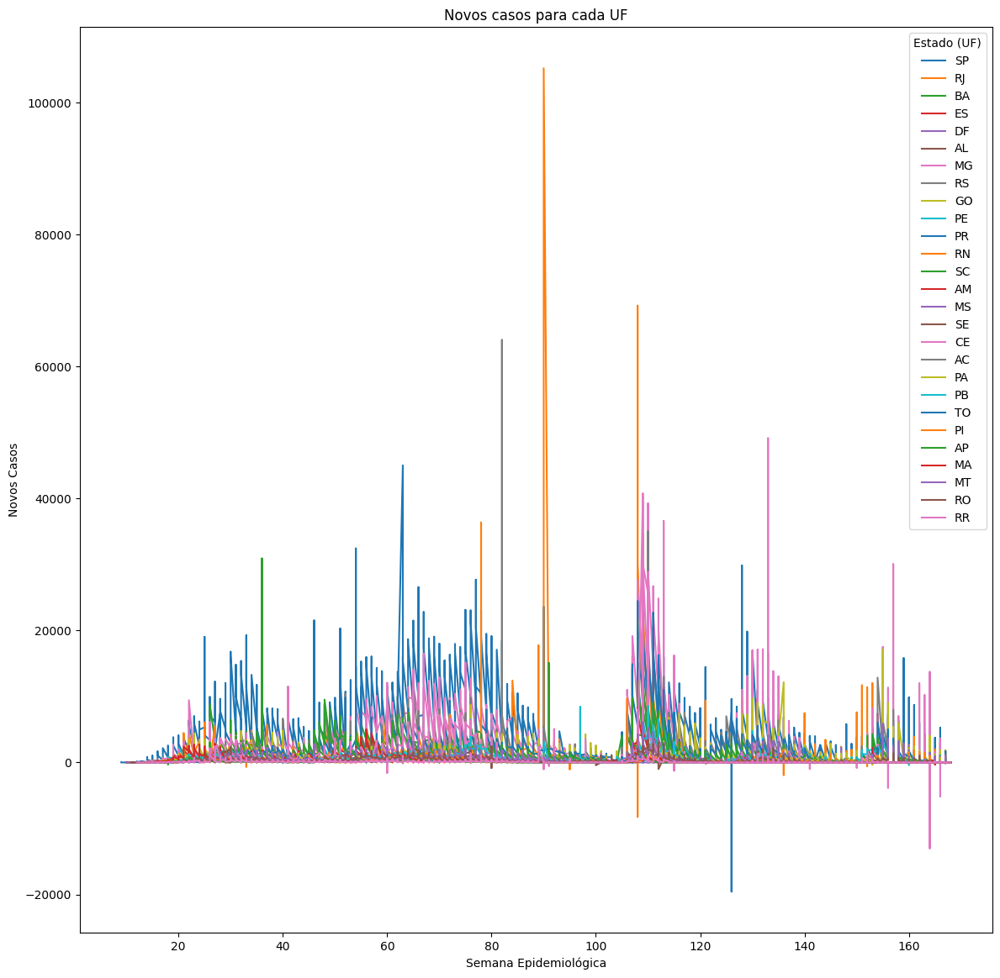

In [17]:
states = df_bruto['state'].unique().tolist()

plt.figure(figsize=(14, 14))

for state in states:
    state_data = df_bruto[df_bruto['state'] == state]
    plt.plot(
        state_data['seq_epi_week'],
        state_data['newCases'],
        label=state,
        linestyle='-',
        )


plt.title('Novos casos para cada UF')
plt.xlabel('Semana Epidemiológica')
plt.ylabel('Novos Casos')

# plt.gcf().autofmt_xdate()

plt.legend(title='Estado (UF)')

plt.show()

Percebemos que existem alguns valores negativos, o que mostra que há algo estranho nessa coluna. Vamos averiguar em mais detalhes.

In [18]:
negative_cases_df = df_bruto[df_bruto['newCases'] < 0]

In [19]:
negative_cases_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 54 entries, 1409 to 30595
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   state              54 non-null     object 
 1   newDeaths          54 non-null     int64  
 2   deaths             54 non-null     int64  
 3   newCases           54 non-null     int64  
 4   totalCases         54 non-null     int64  
 5   recovered          53 non-null     float64
 6   suspects           54 non-null     float64
 7   tests              54 non-null     float64
 8   vaccinated         50 non-null     float64
 9   vaccinated_second  50 non-null     float64
 10  vaccinated_single  46 non-null     float64
 11  vaccinated_third   44 non-null     float64
 12  active_cases       53 non-null     float64
 13  seq_epi_week       54 non-null     int64  
dtypes: float64(8), int64(5), object(1)
memory usage: 6.3+ KB


In [20]:
negative_cases_df.head(10)

,state,newDeaths,deaths,newCases,totalCases,recovered,suspects,tests,vaccinated,vaccinated_second,vaccinated_single,vaccinated_third,active_cases,seq_epi_week
1409,SC,2,50,-290,2104,NaN,621.0,10621.0,NaN,NaN,NaN,NaN,NaN,18
3606,GO,20,1106,-13,40782,12513.0,99654.0,82468.0,NaN,NaN,NaN,NaN,27163.0,30
4261,RN,6,2025,-211,57921,28243.0,18016.0,155861.0,NaN,NaN,NaN,NaN,27653.0,33
4289,RN,17,2042,-649,57272,28243.0,20144.0,155861.0,NaN,NaN,NaN,NaN,26987.0,33
9623,CE,26,10922,-1582,406973,308294.0,37544.0,1373571.0,259525.0,44477.0,NaN,NaN,87757.0,60
10173,SC,107,8277,-110,711953,672006.0,127721.0,1683529.0,267902.0,81351.0,NaN,NaN,31670.0,63
13474,RO,13,6226,-47,251977,234484.0,365081.0,640738.0,540002.0,170092.0,NaN,NaN,11267.0,80
13502,RO,8,6234,-850,251127,234484.0,365081.0,640738.0,551086.0,175909.0,NaN,NaN,10409.0,80
15463,RR,2,1982,-1015,125840,120282.0,5095.0,327716.0,310736.0,101104.0,10231.0,NaN,3576.0,90
15615,CE,1,24158,-531,935400,809911.0,37894.0,2647712.0,5930187.0,3062110.0,159426.0,NaN,101331.0,91


Será que o mesmo se repete para `newDeaths`?

In [21]:
negative_deaths_df = df_bruto[df_bruto['newDeaths'] < 0]
negative_deaths_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 89 entries, 1562 to 30007
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   state              89 non-null     object 
 1   newDeaths          89 non-null     int64  
 2   deaths             89 non-null     int64  
 3   newCases           89 non-null     int64  
 4   totalCases         89 non-null     int64  
 5   recovered          88 non-null     float64
 6   suspects           89 non-null     float64
 7   tests              89 non-null     float64
 8   vaccinated         80 non-null     float64
 9   vaccinated_second  79 non-null     float64
 10  vaccinated_single  79 non-null     float64
 11  vaccinated_third   74 non-null     float64
 12  active_cases       88 non-null     float64
 13  seq_epi_week       89 non-null     int64  
dtypes: float64(8), int64(5), object(1)
memory usage: 10.4+ KB


Precisaremos filtrar esses dados e removê-los, antes de continuar.
Vamos aplicar esse tratamento no nosso `df` original, e mais uma vez separar as colunas em dois datasets, como haviamos feito anteriormente.

In [22]:
# Tratamento: Removendo agregação em 'state'
df = df[df['newDeaths'] >= 0]
df = df[df['newCases'] >= 0]
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 29584 entries, 0 to 30840
Data columns (total 28 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   epi_week                               29584 non-null  int64         
 1   date                                   29584 non-null  datetime64[ns]
 2   country                                29584 non-null  object        
 3   state                                  29584 non-null  object        
 4   city                                   29584 non-null  object        
 5   newDeaths                              29584 non-null  int64         
 6   deaths                                 29584 non-null  int64         
 7   newCases                               29584 non-null  int64         
 8   totalCases                             29584 non-null  int64         
 9   deathsMS                               29584 non-null  int64      

In [23]:
drop_columns = ['country', 'city', 'deaths_by_totalCases', 'deathsMS', 'totalCasesMS', 'epi_week', 'date']
dados_brutos = ['newDeaths', 'deaths', 'newCases', 'totalCases', 'recovered',
                'suspects', 'tests', 'vaccinated', 'vaccinated_second',
                'vaccinated_single', 'vaccinated_third', 'active_cases']
dados_ajustados = ['deaths_per_100k_inhabitants', 'totalCases_per_100k_inhabitants',
                    'tests_per_100k_inhabitants', 'vaccinated_per_100_inhabitants',
                    'vaccinated_second_per_100_inhabitants', 'vaccinated_single_per_100_inhabitants',
                    'vaccinated_third_per_100_inhabitants']

# fazemos drops no dataset original, combinando as colunas a serem descartadas de modo geral
# com as colunas que serao usadas apenas pelo dataset complementar
df_bruto = df.drop(columns=[*drop_columns, *dados_ajustados])
df_comparacao = df.drop(columns=[*drop_columns, *dados_brutos])

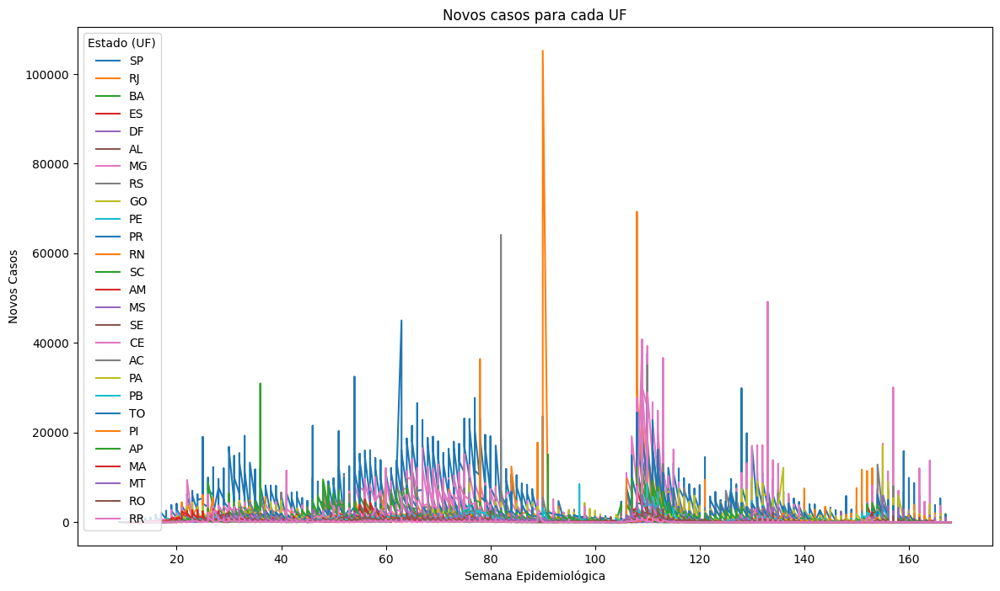

In [24]:
states = df_bruto['state'].unique().tolist()

plt.figure(figsize=(14, 8))

for state in states:
    state_data = df_bruto[df_bruto['state'] == state]
    plt.plot(
        state_data['seq_epi_week'],
        state_data['newCases'],
        label=state,
        linestyle='-',
        )


plt.title('Novos casos para cada UF')
plt.xlabel('Semana Epidemiológica')
plt.ylabel('Novos Casos')

# plt.gcf().autofmt_xdate()

plt.legend(title='Estado (UF)')

plt.show()

Vamos tentar entender um pouco mais como os dados se relacionam.

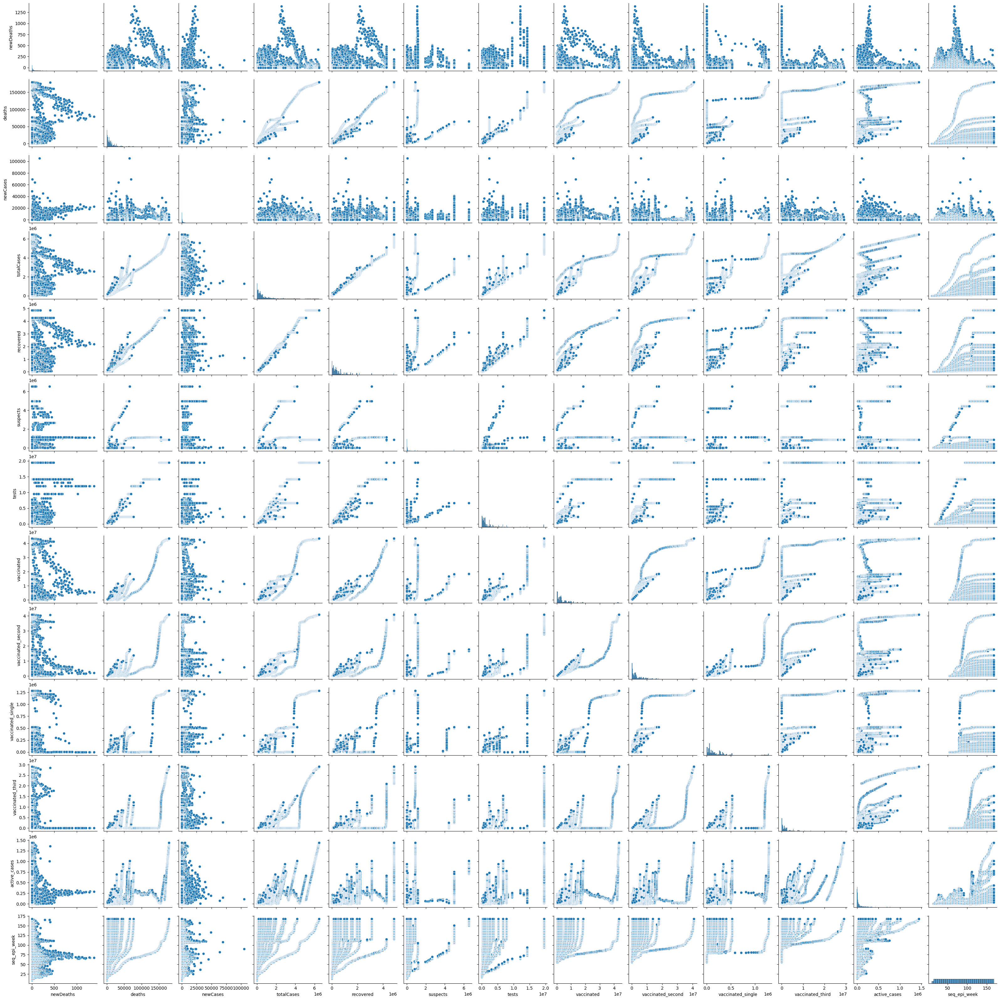

In [25]:
sns.pairplot(df_bruto)

E vamos aplicar um pré-processamento para garantir que os dados vão se comportar de maneira mais uniforme, antes de tentar visualizar a correlação entre eles. Ao final desse processo, esperamos poder montar uma `pipeline` de tratamento, limpeza e transformação dos dados antes de tentarmos aplicar modelos.

Nosso objetivo inicial é tentar compreender como as métricas que temos se relacionam.

In [26]:
df_bruto.describe()

,newDeaths,deaths,newCases,totalCases,recovered,suspects,tests,vaccinated,vaccinated_second,vaccinated_single,vaccinated_third,active_cases,seq_epi_week
count,29584.000000,29584.000000,29584.000000,2.958400e+04,2.897000e+04,2.901700e+04,2.831100e+04,2.119300e+04,2.055900e+04,1.693800e+04,1.482600e+04,2.897000e+04,29584.000000
mean,23.636898,16615.634870,1253.512101,7.217528e+05,6.239111e+05,2.343294e+05,1.845772e+06,5.082167e+06,4.289688e+06,1.882482e+05,3.022626e+06,9.616648e+04,89.709776
std,62.822988,27164.211007,2691.090260,1.006599e+06,8.444474e+05,7.844654e+05,3.086413e+06,7.390578e+06,6.691285e+06,2.407221e+05,4.869555e+06,1.858477e+05,45.379805
min,0.000000,0.000000,0.000000,1.000000e+00,1.000000e+00,1.000000e+00,8.540000e+02,2.000000e+00,4.000000e+00,1.900000e+01,1.000000e+00,-7.627000e+03,9.000000
25%,1.000000,2412.500000,76.000000,1.404878e+05,1.260230e+05,1.141000e+03,4.037740e+05,9.736860e+05,5.733875e+05,5.341300e+04,3.520670e+05,7.563250e+03,50.000000
50%,5.000000,7959.000000,417.000000,3.649570e+05,3.330945e+05,1.064700e+04,9.039750e+05,2.711251e+06,2.262640e+06,1.123220e+05,1.377746e+06,2.200500e+04,90.000000
75%,20.000000,18567.500000,1274.000000,8.498630e+05,6.994770e+05,1.301170e+05,2.164746e+06,6.305426e+06,5.382482e+06,2.617970e+05,3.216344e+06,9.304225e+04,129.000000
max,1389.000000,179039.000000,105200.000000,6.469442e+06,4.850000e+06,6.540804e+06,1.950178e+07,4.338128e+07,4.085721e+07,1.286285e+06,2.905742e+07,1.440403e+06,168.000000


In [27]:
df_pretransform = df_bruto.drop(columns=['state'])
df_pretransform.info()

<class 'pandas.core.frame.DataFrame'>
Index: 29584 entries, 0 to 30840
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   newDeaths          29584 non-null  int64  
 1   deaths             29584 non-null  int64  
 2   newCases           29584 non-null  int64  
 3   totalCases         29584 non-null  int64  
 4   recovered          28970 non-null  float64
 5   suspects           29017 non-null  float64
 6   tests              28311 non-null  float64
 7   vaccinated         21193 non-null  float64
 8   vaccinated_second  20559 non-null  float64
 9   vaccinated_single  16938 non-null  float64
 10  vaccinated_third   14826 non-null  float64
 11  active_cases       28970 non-null  float64
 12  seq_epi_week       29584 non-null  int64  
dtypes: float64(8), int64(5)
memory usage: 3.2 MB


Ainda temos alguns valores nulos. Vamos utilizar o `SimpleInputer` do `SKLearn` para ajustar e substituir esses valores.

In [28]:
input_num = SimpleImputer()
filled = input_num.fit_transform(df_pretransform)

df_filled = pd.DataFrame(
    data=filled,
    columns=df_pretransform.columns
)

In [29]:
df_filled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29584 entries, 0 to 29583
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   newDeaths          29584 non-null  float64
 1   deaths             29584 non-null  float64
 2   newCases           29584 non-null  float64
 3   totalCases         29584 non-null  float64
 4   recovered          29584 non-null  float64
 5   suspects           29584 non-null  float64
 6   tests              29584 non-null  float64
 7   vaccinated         29584 non-null  float64
 8   vaccinated_second  29584 non-null  float64
 9   vaccinated_single  29584 non-null  float64
 10  vaccinated_third   29584 non-null  float64
 11  active_cases       29584 non-null  float64
 12  seq_epi_week       29584 non-null  float64
dtypes: float64(13)
memory usage: 2.9 MB


In [30]:
# usando o MinMaxScaler do SKLearn
scaler = MinMaxScaler()
transformed_data = scaler.fit_transform(df_filled)

In [31]:
df_transformed = pd.DataFrame(
    data=transformed_data,
    columns=df_filled.columns
)

df_transformed.describe()

,newDeaths,deaths,newCases,totalCases,recovered,suspects,tests,vaccinated,vaccinated_second,vaccinated_single,vaccinated_third,active_cases,seq_epi_week
count,29584.000000,29584.000000,29584.000000,29584.000000,29584.000000,29584.000000,29584.000000,29584.000000,29584.000000,29584.000000,29584.000000,29584.000000,29584.000000
mean,0.017017,0.092805,0.011916,0.111563,0.128641,0.035826,0.094607,0.117151,0.104992,0.146338,0.104022,0.071679,0.507609
std,0.045229,0.151722,0.025581,0.155593,0.172297,0.118779,0.154827,0.144192,0.136524,0.141606,0.118634,0.127006,0.285408
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000720,0.013475,0.000722,0.021715,0.025984,0.000186,0.021366,0.040308,0.028444,0.066651,0.047364,0.010623,0.257862
50%,0.003600,0.044454,0.003964,0.056412,0.072057,0.001628,0.050938,0.117151,0.104992,0.146338,0.104022,0.021078,0.509434
75%,0.014399,0.103706,0.012110,0.131366,0.144222,0.026308,0.101393,0.117151,0.104992,0.146338,0.104022,0.071679,0.754717
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


<Axes: >

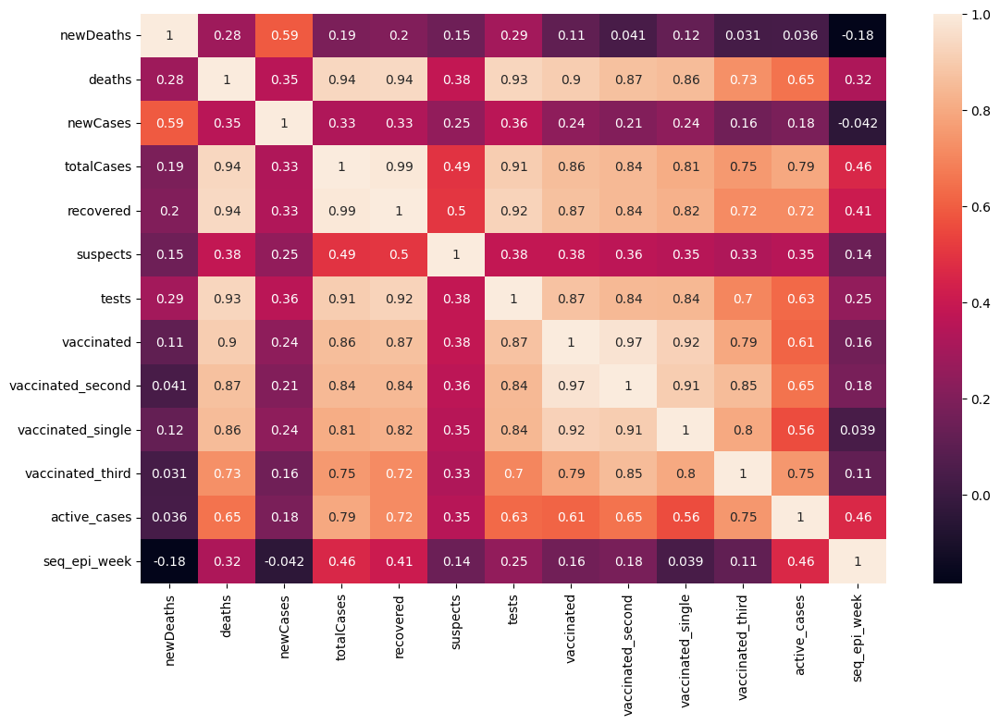

In [32]:
plt.figure(figsize=(13,8))
sns.heatmap(df_transformed.corr(), annot=True)

As _features_ de `vaccinated_single`, `vaccinated_second`, `vaccinated_third` parecem estar muito relacionadas, e após a primeira aplicação dos métodos de definição do número de clusters, acabamos decidindo remover essas colunas do dataset, esperando encontrarmos um comportamento diferente no dataset.

Em seguida, vamos repetir os passos até a obtenção da matriz de correlação e do `pairplot`.

In [68]:
drop_columns = ['country', 'city', 'deaths_by_totalCases', 'deathsMS',
                'totalCasesMS', 'epi_week', 'date', 'vaccinated_second',
                'vaccinated_single', 'vaccinated_third']
dados_ajustados = ['deaths_per_100k_inhabitants', 'totalCases_per_100k_inhabitants',
                    'tests_per_100k_inhabitants', 'vaccinated_per_100_inhabitants',
                    'vaccinated_second_per_100_inhabitants', 'vaccinated_single_per_100_inhabitants',
                    'vaccinated_third_per_100_inhabitants']

df_bruto = df.drop(columns=[*drop_columns, *dados_ajustados])

In [69]:
df_bruto.describe()

,newDeaths,deaths,newCases,totalCases,recovered,suspects,tests,vaccinated,active_cases,seq_epi_week
count,29584.000000,29584.000000,29584.000000,2.958400e+04,2.897000e+04,2.901700e+04,2.831100e+04,2.119300e+04,2.897000e+04,29584.000000
mean,23.636898,16615.634870,1253.512101,7.217528e+05,6.239111e+05,2.343294e+05,1.845772e+06,5.082167e+06,9.616648e+04,89.709776
std,62.822988,27164.211007,2691.090260,1.006599e+06,8.444474e+05,7.844654e+05,3.086413e+06,7.390578e+06,1.858477e+05,45.379805
min,0.000000,0.000000,0.000000,1.000000e+00,1.000000e+00,1.000000e+00,8.540000e+02,2.000000e+00,-7.627000e+03,9.000000
25%,1.000000,2412.500000,76.000000,1.404878e+05,1.260230e+05,1.141000e+03,4.037740e+05,9.736860e+05,7.563250e+03,50.000000
50%,5.000000,7959.000000,417.000000,3.649570e+05,3.330945e+05,1.064700e+04,9.039750e+05,2.711251e+06,2.200500e+04,90.000000
75%,20.000000,18567.500000,1274.000000,8.498630e+05,6.994770e+05,1.301170e+05,2.164746e+06,6.305426e+06,9.304225e+04,129.000000
max,1389.000000,179039.000000,105200.000000,6.469442e+06,4.850000e+06,6.540804e+06,1.950178e+07,4.338128e+07,1.440403e+06,168.000000


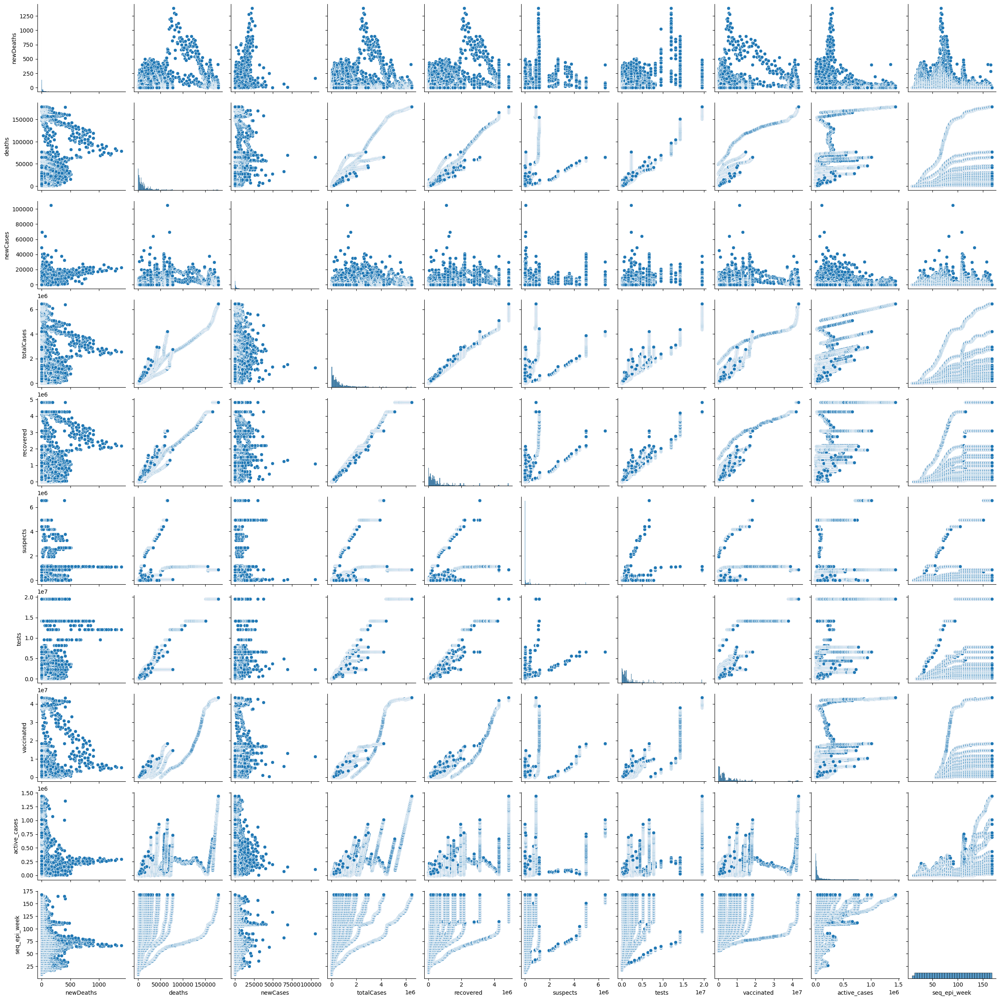

In [70]:
sns.pairplot(df_bruto)

In [71]:
df_pretransform = df_bruto.drop(columns=['state'])
df_pretransform.info()

<class 'pandas.core.frame.DataFrame'>
Index: 29584 entries, 0 to 30840
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   newDeaths     29584 non-null  int64  
 1   deaths        29584 non-null  int64  
 2   newCases      29584 non-null  int64  
 3   totalCases    29584 non-null  int64  
 4   recovered     28970 non-null  float64
 5   suspects      29017 non-null  float64
 6   tests         28311 non-null  float64
 7   vaccinated    21193 non-null  float64
 8   active_cases  28970 non-null  float64
 9   seq_epi_week  29584 non-null  int64  
dtypes: float64(5), int64(5)
memory usage: 2.5 MB


In [72]:
df_pretransform = df_bruto.drop(columns=['state'])
df_pretransform.info()

<class 'pandas.core.frame.DataFrame'>
Index: 29584 entries, 0 to 30840
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   newDeaths     29584 non-null  int64  
 1   deaths        29584 non-null  int64  
 2   newCases      29584 non-null  int64  
 3   totalCases    29584 non-null  int64  
 4   recovered     28970 non-null  float64
 5   suspects      29017 non-null  float64
 6   tests         28311 non-null  float64
 7   vaccinated    21193 non-null  float64
 8   active_cases  28970 non-null  float64
 9   seq_epi_week  29584 non-null  int64  
dtypes: float64(5), int64(5)
memory usage: 2.5 MB


In [73]:
input_num = SimpleImputer()
filled = input_num.fit_transform(df_pretransform)

df_filled = pd.DataFrame(
    data=filled,
    columns=df_pretransform.columns
)

scaler = MinMaxScaler()
transformed_data = scaler.fit_transform(df_filled)

df_transformed = pd.DataFrame(
    data=transformed_data,
    columns=df_filled.columns
)

<Axes: >

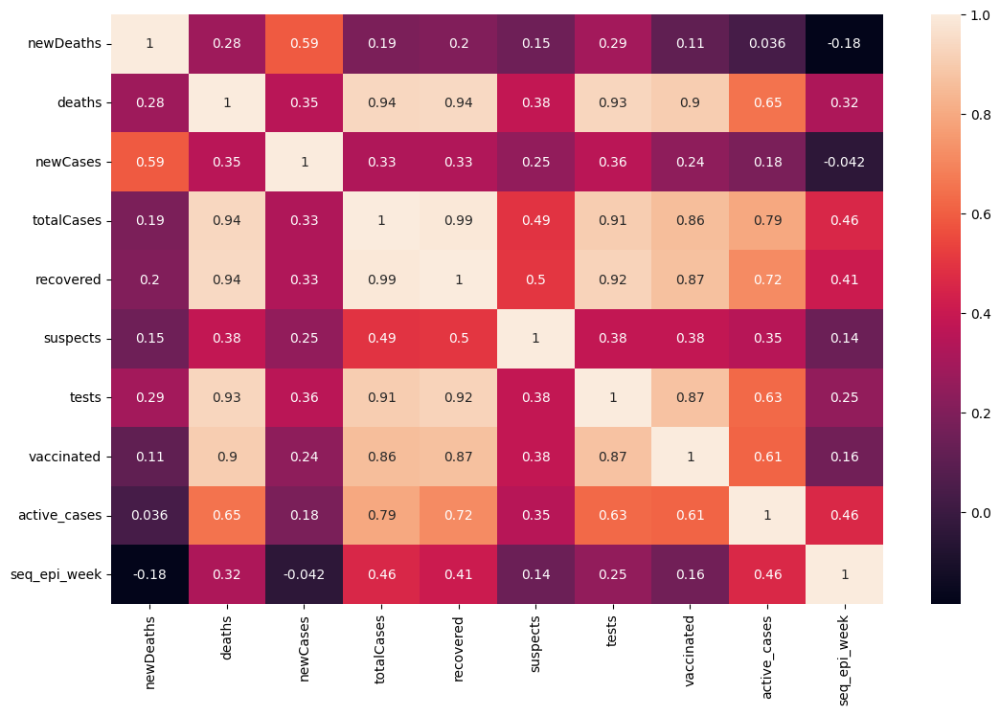

In [74]:
plt.figure(figsize=(13,8))
sns.heatmap(df_transformed.corr(), annot=True)

# Parte 2 - Montando o Modelo

## Definindo o que será aplicado:
> Por definição, **problemas de clusterização** são não-supervisionados. Isso quer dizer que a amostra não contém _targets_, apenas as _features_. Sendo assim, nosso objetivo é justamente o de descobrir **alguma estrutura de agrupamento** nos dados, sem informação prévia quanto aos grupos a serem formados. Ou, mais formalmente: _"O objetivo central é dividir os dados em grupos distintos, tais que membros de cada grupo sejam similares entre si."_

### Aplicando o método para definição de clusters.
Inicialmente, aplicaremos a métrica de Inércia (WCSS - _Wihtin-Cluster-Sum-of-Squares_) e o método do cotovelo para tentar definir quantos clusters idealmente nosso modelo deve ter.

Esse método consiste em rodar o _k-Means_ várias vezes, para diferentes valores de $k$ e depois plotar um gráfico com a **inércia** de cada uma das rodadas.

In [79]:
# cada etapa dessa função é parte da seção anterior do notebook
def get_dataset() -> pd.DataFrame:
    df = pd.read_csv('https://raw.githubusercontent.com/wcota/covid19br/master/cases-brazil-states.csv')

    df['active_cases'] = df['totalCases'] - df['deaths'] - df['recovered']
    unique_weeks = df['epi_week'].unique()
    unique_weeks.sort()

    mapped_values = { value: new_value for new_value, value in enumerate(unique_weeks, start=unique_weeks[0])}
    df['seq_epi_week'] = df['epi_week'].map(mapped_values)

    df = df[df['state'] != 'TOTAL']

    df = df[df['newDeaths'] >= 0]
    df = df[df['newCases'] >= 0]

    drop_columns = ['country', 'city', 'deaths_by_totalCases', 'deathsMS', 'totalCasesMS',
                    'epi_week', 'date', 'state', 'vaccinated_second',
                    'vaccinated_single', 'vaccinated_third']
    dados_ajustados = ['deaths_per_100k_inhabitants', 'totalCases_per_100k_inhabitants',
                        'tests_per_100k_inhabitants', 'vaccinated_per_100_inhabitants',
                        'vaccinated_second_per_100_inhabitants', 'vaccinated_single_per_100_inhabitants',
                        'vaccinated_third_per_100_inhabitants']

    df_bruto = df.drop(columns=[*drop_columns, *dados_ajustados])

    input_num = SimpleImputer()
    filled = input_num.fit_transform(df_bruto)

    df_filled = pd.DataFrame(
        data=filled,
        columns=df_bruto.columns
    )

    scaler = MinMaxScaler()
    transformed_data = scaler.fit_transform(df_filled)
    df_transformed = pd.DataFrame(
        data=transformed_data,
        columns=df_filled.columns
    )
    return df_transformed

In [80]:
def calc_inercias(X, lista_k):
    lista_inercias = []
    
    for k in lista_k:
        kmeans = KMeans(n_clusters = k, n_init='auto')
        kmeans.fit(X)

        # Cálculo das inércias
        inercia = kmeans.inertia_
        lista_inercias.append(inercia)

    return lista_inercias

In [81]:
# função para plotar as inércias
def plot_cotovelo(lista_k, lista_inercias):
    plt.figure(figsize=(8,5))
    
    plt.title('Método do cotovelo')
    plt.plot(lista_k, lista_inercias, marker = "o")
    
    plt.xlabel("k")
    plt.ylabel("Inércia (WCSS)")
    
    plt.show()

In [82]:
df_covid = get_dataset()
df_covid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29584 entries, 0 to 29583
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   newDeaths     29584 non-null  float64
 1   deaths        29584 non-null  float64
 2   newCases      29584 non-null  float64
 3   totalCases    29584 non-null  float64
 4   recovered     29584 non-null  float64
 5   suspects      29584 non-null  float64
 6   tests         29584 non-null  float64
 7   vaccinated    29584 non-null  float64
 8   active_cases  29584 non-null  float64
 9   seq_epi_week  29584 non-null  float64
dtypes: float64(10)
memory usage: 2.3 MB


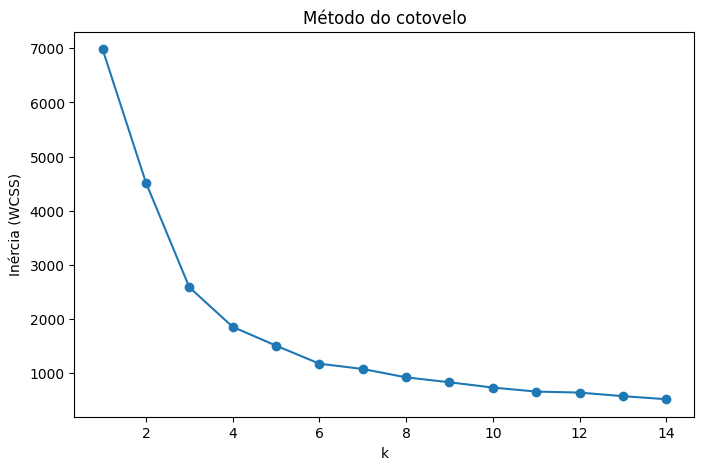

In [83]:
inercias = calc_inercias(df_covid, range(1, 15))
plot_cotovelo(range(1, 15), inercias)

Pela aplicação do método do cotovelo, parece que $k = 4$ é o nosso número ideal de _clusters_.

### Aplicando o método da Silhueta

In [84]:
def calc_silhueta(X, lista_k):
    lista_silhuetas = []

    for k in lista_k:
        try:
            kmeans = KMeans(n_clusters=k, n_init='auto')
            kmeans.fit(X)

            labels_clusters = kmeans.labels_
            silhueta = silhouette_score(X, labels_clusters)
            lista_silhuetas.append(silhueta)
        except ValueError as err:
            print(k, err)

    return lista_silhuetas

In [85]:
def plot_silhuetas(X, lista_k):
    lista_silhuetas = calc_silhueta(X, lista_k)
    plt.figure(figsize=(8, 5))
    plt.title('Método da Silhueta')
    plt.plot(lista_k, lista_silhuetas, marker='o')

    plt.xlabel('k (# de clusters)')
    plt.ylabel('Mean silhouette score')
    plt.show()

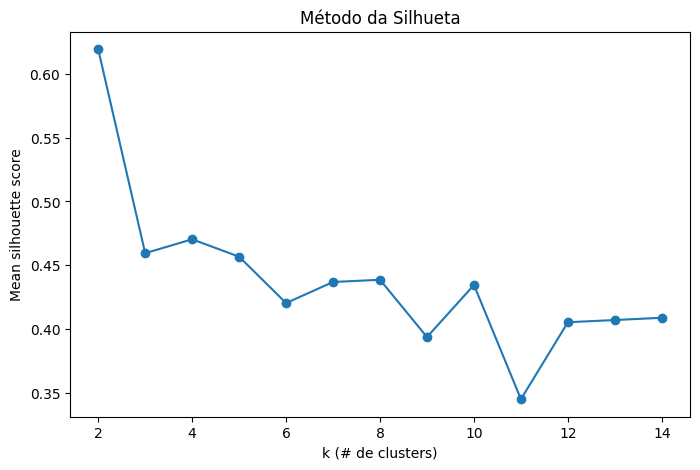

In [86]:
silhuetas = plot_silhuetas(df_covid, range(2, 15))

Pelo método da silhueta, buscamos o valor médio de silhueta mais próximo de 1. Nesse caso, excetuando o valor de $k = 2$, teriamos $k = 4$, o que é um resultado comparável com a aplicação do **método do cotovelo**. Vamos tentar aplicar o **KMeans** com 4 clusters para ver o resultado.

## Aplicando o KMeans

### Clusters: 2

In [101]:
df_covid = get_dataset()

In [102]:
estimador = KMeans(
    n_clusters=2,
    random_state=42,
)

modelo = estimador.fit(df_covid)

In [103]:
modelo.labels_

array([0, 0, 0, ..., 0, 1, 0])

In [104]:
df_covid['cluster'] = modelo.labels_
df_covid.head()

,newDeaths,deaths,newCases,totalCases,recovered,suspects,tests,vaccinated,active_cases,seq_epi_week,cluster
0,0.0,0.0,0.00001,0.000000e+00,0.128641,0.035826,0.094607,0.117151,0.071679,0.0,0
1,0.0,0.0,0.00000,0.000000e+00,0.128641,0.035826,0.094607,0.117151,0.071679,0.0,0
2,0.0,0.0,0.00000,0.000000e+00,0.128641,0.035826,0.094607,0.117151,0.071679,0.0,0
3,0.0,0.0,0.00001,1.545729e-07,0.128641,0.035826,0.094607,0.117151,0.071679,0.0,0
4,0.0,0.0,0.00000,1.545729e-07,0.128641,0.035826,0.094607,0.117151,0.071679,0.0,0


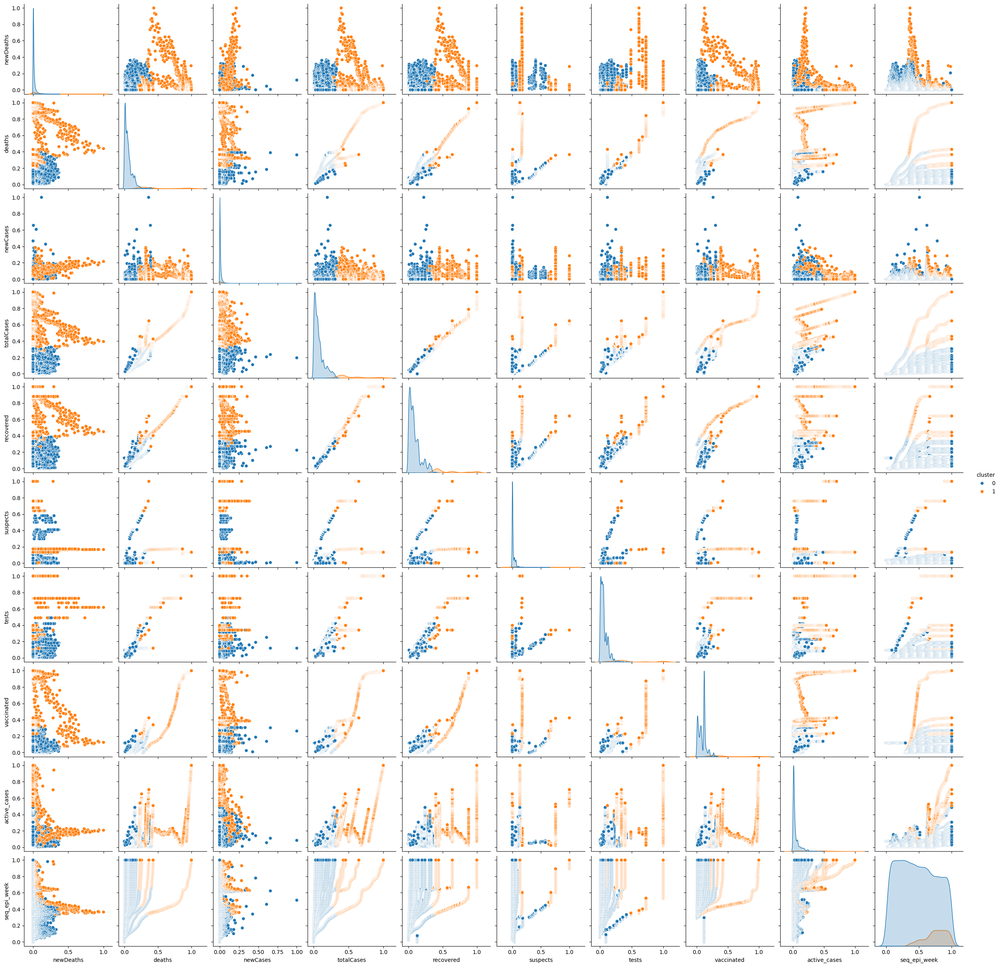

In [105]:
sns.pairplot(df_covid, hue='cluster')

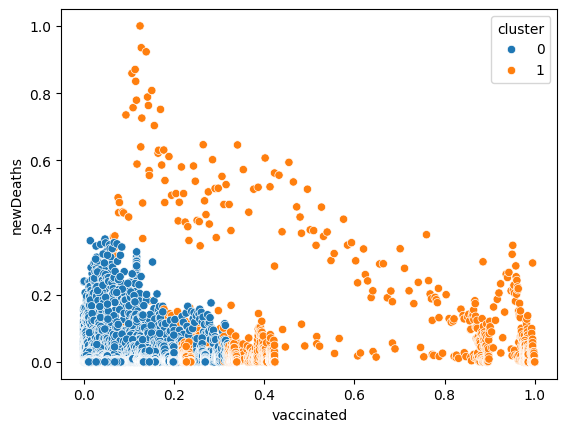

In [106]:
sns.scatterplot(
    data=df_covid,
    x='vaccinated',
    y='newDeaths',
    hue='cluster',
)
plt.show()

### Clusters: 4

In [107]:
df_covid = get_dataset()

In [108]:
estimador = KMeans(
    n_clusters=4,
    random_state=42,
)

modelo = estimador.fit(df_covid)

In [109]:
df_covid['cluster'] = modelo.labels_
df_covid.head()

,newDeaths,deaths,newCases,totalCases,recovered,suspects,tests,vaccinated,active_cases,seq_epi_week,cluster
0,0.0,0.0,0.00001,0.000000e+00,0.128641,0.035826,0.094607,0.117151,0.071679,0.0,2
1,0.0,0.0,0.00000,0.000000e+00,0.128641,0.035826,0.094607,0.117151,0.071679,0.0,2
2,0.0,0.0,0.00000,0.000000e+00,0.128641,0.035826,0.094607,0.117151,0.071679,0.0,2
3,0.0,0.0,0.00001,1.545729e-07,0.128641,0.035826,0.094607,0.117151,0.071679,0.0,2
4,0.0,0.0,0.00000,1.545729e-07,0.128641,0.035826,0.094607,0.117151,0.071679,0.0,2


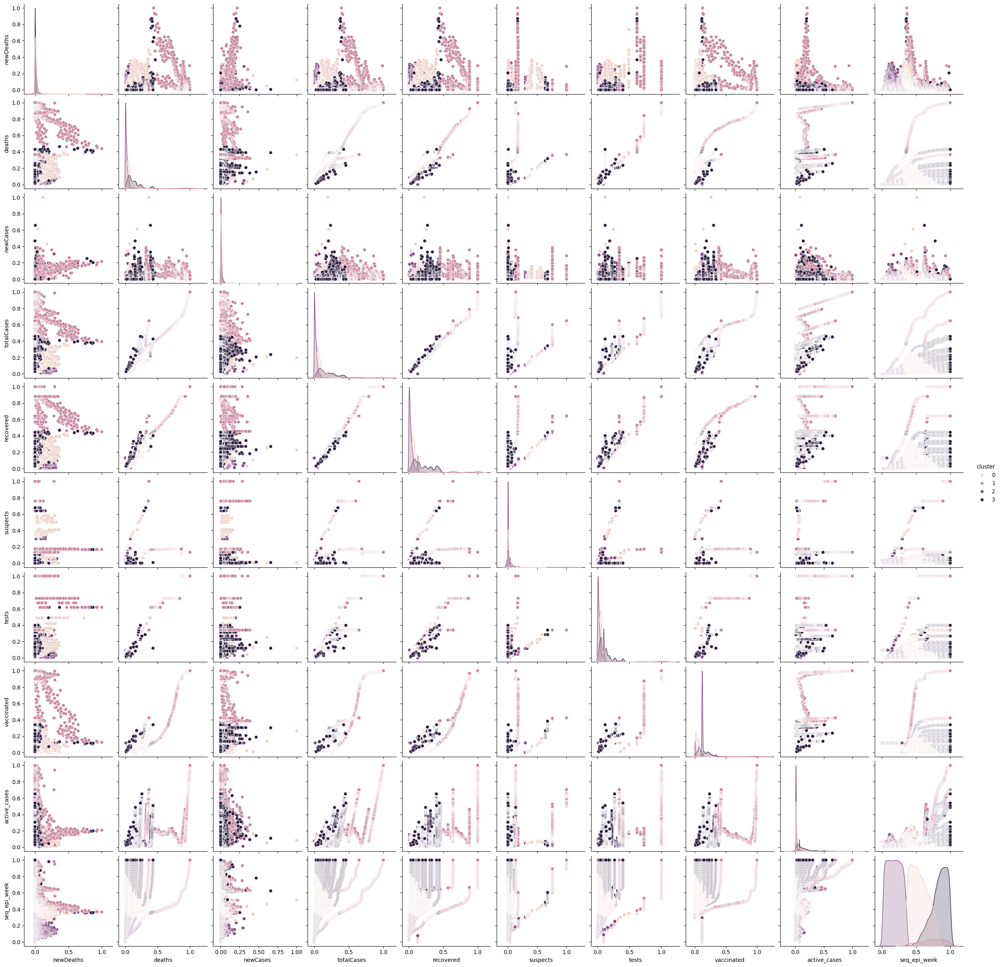

In [110]:
sns.pairplot(df_covid, hue='cluster')

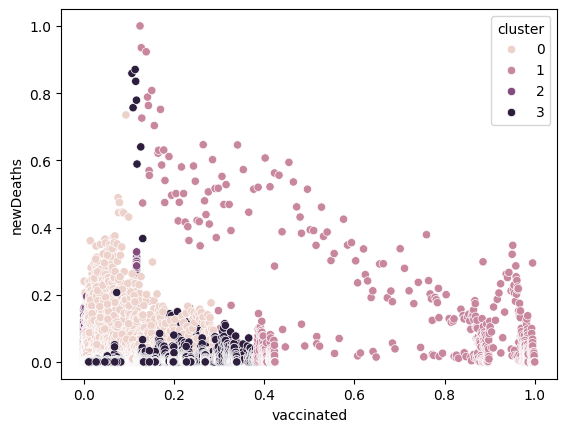

In [111]:
sns.scatterplot(
    data=df_covid,
    x='vaccinated',
    y='newDeaths',
    hue='cluster',
)
plt.show()

### Interpretação
Apesar de conseguirmos perceber alguma separação entre parte dos dados, ainda parece haver uma sobreposição ao tentarmos perceber o _dataset_ comparando duas variáveis.